## Kickstarter EDA
This study pulls together an assortment of Kickstarter files and runs an exploratory data analysis (EDA) on how different factors affect success. <br> 
Depending on the data file, success is defined by one or more of the following metrics: 
1. Success/Failure: Whether a fundraising goal was reached or not. 
2. Backers:  Number of backers. 
3. Magnitude: degree to which goals were passed. 

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import os
import re
import collections  # returns frequencies 
import DS_functions_KS as DF
# For Text processing
import string             # use punctuation method to remove punctuation in lines later 
from wordcloud import WordCloud, STOPWORDS  
import nltk 
# Lemmatizer reduces words into their root form: wolves -> wolf, jumping -> jump, etc. 
from nltk.stem import WordNetLemmatizer as WNL    
from nltk.corpus import wordnet 
from nltk import pos_tag
from nltk.corpus import stopwords

In [8]:
# display more than one record in cell 
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
# Dark mode display 
from jupyterthemes import jtplot
jtplot.style(theme='monokai', context='notebook', ticks=True, grid=False)

### Data Files
In this study, we pull data files that contain success variables (response variables), with different feature variables (Factors). The data files are taken from: 
1. [Kickstarter 2010-7](https://www.kaggle.com/carlolepelaars/exploration-of-kickstarter-data-2010-2017/data): data17 
2. [Kickstarter: 2010-5](https://www.kaggle.com/dilipajm/kickstarter-project-funding-prediction/data)  data15
3. [Short data set with 4k records](https://www.kaggle.com/socathie/kickstarter-project-statistics) data_sht

In [9]:
# Import Kickstarter files 
data17 = pd.read_csv('ks-projects-201612.csv', encoding = "ISO-8859-1")
data15 = pd.read_csv('ks_train.csv')
data_sht = pd.read_csv('most_backed.csv')

C:\Users\Owner\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3051: DtypeWarning: Columns (13,14,15) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


### Preprocessing
Format all numbers within 3 decimal places 

In [3]:
# first format to 3 decimals 
pd.options.display.float_format = '{:.2f}'.format

### Preprocessing 2010-7 series (data17)
This is the largest of the three files (328k records). <br> 
1. Remove all leading and trailling spaces from **column titles**
2. Remove rows where column conversion failed: this shows up as "unnamed" columns 13-16. 
3. Format **date** and **numeric** columns from object to datetime or numeric format 
4. Check **Duplicates**

In [7]:
data17.dtypes
xcols = [x.strip() for x in data17.columns]
data17.columns = xcols
data17.columns

ID                  int64
name               object
category           object
main_category      object
currency           object
deadline           object
goal               object
launched           object
pledged            object
state              object
backers            object
country            object
usd pledged        object
Unnamed: 13        object
Unnamed: 14        object
Unnamed: 15        object
Unnamed: 16       float64
dtype: object

Index(['ID', 'name', 'category', 'main_category', 'currency', 'deadline',
       'goal', 'launched', 'pledged', 'state', 'backers', 'country',
       'usd pledged', 'Unnamed: 13', 'Unnamed: 14', 'Unnamed: 15',
       'Unnamed: 16'],
      dtype='object')

**Processing 'Unnamed" columns** <br> 
Most records have 'Unnamed' columns with are empty. We examine the non-null records and find 625/320+k records have unnamed columns that are not-null.<br> 
We remove these records 

In [8]:
print("sample of records with null Unnamed columns ")
data17[data17['Unnamed: 13'].isnull()].iloc[1:5,13:17]
print("No. of records w/ to be removed:", len(data17[data17['Unnamed: 13'].notnull()]))
data17 = data17.drop(data17.columns[13:17],axis=1)

sample of records with null Unnamed columns 


,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16
1,NaN,NaN,NaN,nan
2,NaN,NaN,NaN,nan
3,NaN,NaN,NaN,nan
4,NaN,NaN,NaN,nan


No. of records w/ to be removed: 625


**Remove records with null response variables.** <br> 
Find that removing null goal values also removes all null backers. 

In [11]:
nan_goal_id = data17.ID[data17.goal.isnull()]
data17 = data17.drop(data17[data17.ID.isin(nan_goal_id)].index)
print('No. of Null Backers')
len(data17[data17.backers.isnull()])
print("No. of Null goals ")
len(data17[data17.goal.isnull()])

No. of Null Backers


0

No. of Null goals 


0

**Format dates and numeric fields**

In [12]:
# Numeric: convert goal, pledged, backers, and usd pledged to numbers 
data17['goal'] = pd.to_numeric(data17.goal, errors='coerce')
data17['pledged'] = pd.to_numeric(data17.pledged, errors='coerce')
data17['usd pledged'] = pd.to_numeric(data17['usd pledged'], errors='coerce')
data17['backers'] = pd.to_numeric(data17.backers, errors='coerce')
data17[['goal','pledged','usd pledged','backers']].dtypes

# Format dates
data17.launched = pd.to_datetime(data17.launched)
data17.deadline = pd.to_datetime(data17.deadline)
data17.dtypes

goal           float64
pledged        float64
usd pledged    float64
backers        float64
dtype: object

ID                        int64
name                     object
category                 object
main_category            object
currency                 object
deadline         datetime64[ns]
goal                    float64
launched         datetime64[ns]
pledged                 float64
state                    object
backers                 float64
country                  object
usd pledged             float64
dtype: object

In [13]:
# Check for duplicates='ID'
dup = data17[data17.duplicated(subset='ID',keep=False)]
len(dup)

0

### Preprocessing Kickstarter 2010-15 Series
1. Format Dates 
2. Check for duplicates

In [13]:
data15.deadline = pd.to_datetime(data15.deadline, origin='unix', unit='s')
data15.state_changed_at = pd.to_datetime(data15.state_changed_at, origin='unix', unit='s')
data15.created_at = pd.to_datetime(data15.created_at, origin='unix', unit='s')
data15.launched_at = pd.to_datetime(data15.launched_at, origin='unix', unit='s')
data15[['deadline','state_changed_at','created_at','launched_at']].dtypes
data15[['deadline','state_changed_at','created_at','launched_at']].head()

deadline            datetime64[ns]
state_changed_at    datetime64[ns]
created_at          datetime64[ns]
launched_at         datetime64[ns]
dtype: object

,deadline,state_changed_at,created_at,launched_at
0,2009-05-03 06:59:59,2009-05-03 07:00:17,2009-04-24 19:15:07,2009-04-24 19:52:03
1,2009-05-15 23:10:00,2009-05-16 00:00:18,2009-04-28 23:10:24,2009-04-29 03:26:32
2,2009-05-22 21:26:00,2009-05-22 21:30:18,2009-05-12 21:26:53,2009-05-12 21:39:58
3,2009-05-29 00:09:00,2009-05-29 00:15:21,2009-04-29 00:09:55,2009-04-29 00:58:50
4,2009-05-31 11:38:00,2009-05-31 11:45:17,2009-05-01 11:38:34,2009-05-01 12:22:21


In [14]:
# check for duplicates 
dup = data15[data15.duplicated(subset='project_id',keep=False) ]
len(dup)  # no duplicates 

0

## Preprocessing of 4k-record set

### 4k set: Processing Pledge & Backer Tiers
While small (4k records), this is the only dataset contains **Pledge tiers and backers**, both of which are stored in lists. We use the below functions to create a flattened version of the dataframe. 
Example list:  [1.0, 14.0, 19.0, 19.0, 35.0, 35.0, 79.0, 79.0, 129.0, 129.0, 849.0, 849.0]
Call three functions: assuming list item stored as text with brackets. <br>
1. Length of List: Returns length of a list for each row
2. Flatten contents: Create new row record for each item in list. 
3. Create new expanded dataframe with each list item receiving new row (rest of df stays same). 

### Text Processing
Initiate wordcloud, load functions to process tokens. <br> 
These functions will be called under Keyword Exploration section 

In [15]:
wlem = WNL()  # Inititate Lemmatizer

### Response Variables (2010-7 set) 
1. Average Pledge 
2. Pledged vs. Goal
3. State: Currently has 6 states: convert to 2: success/failure 

In [57]:
# Average Pledge 
data17['avg_pledge'] = np.where(data17['backers']==0,0,data17['usd pledged'] / data17['backers'] )
print("Avg Pledge Stats:")
stats.describe(data17['avg_pledge'])

# Pledged v. Goal 
data17['pledgedvgoal'] = np.where(data17["usd pledged"].isnull(), 0, data17['usd pledged'] / data17['goal'])
print("Pledged v. Goal Stats:")
stats.describe(data17['pledgedvgoal'])

Avg Pledge Stats:


DescribeResult(nobs=323118, minmax=(0.0, 10000.0), mean=59.78752558892141, variance=17451.190525467344, skewness=25.40103612965577, kurtosis=1312.1669675800613)

Pledged v. Goal Stats:


DescribeResult(nobs=323118, minmax=(0.0, 55266.57), mean=2.6102743624017553, variance=30920.894458854862, skewness=190.1314333700369, kurtosis=46355.55784777164)

**Evalute State (Data17)**

In [58]:
    # Status: State value counts 
data17.state.value_counts()

failed        168221
successful    113081
canceled       32354
live            4428
undefined       3555
suspended       1479
Name: state, dtype: int64

In [59]:
# State: Evaluate which states to keep 
print("stats for canceled")
data17.pledgedvgoal[data17['state']=='canceled'].describe()  # median close to 0 with massive outliers 
print("stats for suspended")
data17.pledgedvgoal[data17['state']=='suspended'].describe()  # designate as fail
print("stats for undefined")
data17.pledgedvgoal[data17['state']=='undefined'].describe()  # all zeroes: remove  
data17 = data17[data17['state'].isin(['failed','successful','canceled','suspended'])]

stats for canceled


count   32354.00
mean        1.42
std       118.73
min         0.00
25%         0.00
50%         0.01
75%         0.08
max     16283.38
Name: pledgedvgoal, dtype: float64

stats for suspended


count   1479.00
mean       1.52
std       17.80
min        0.00
25%        0.00
50%        0.01
75%        0.25
max      560.40
Name: pledgedvgoal, dtype: float64

stats for undefined


count   3555.00
mean       0.00
std        0.00
min        0.00
25%        0.00
50%        0.00
75%        0.00
max        0.00
Name: pledgedvgoal, dtype: float64

From results above, remove 'state' records that are live or undefined <br> 
For remaining records, Create new field **status**: <br>  
1: State = 'Successful' 
0: everything else 

In [60]:
# remove Live and undefined 
data17 = data17[data17['state'].isin(['failed','successful','canceled','undefined'])]

In [61]:
status = np.where(data17['state'] == 'successful', 1, 0)
collections.Counter(status)
    # add Status to datafreame 
data17['outcome'] = status

Counter({0: 200575, 1: 113081})

### Response Variables (2009-5 set: data15) 
Comes with backer count and status. Pledge amount not provided. 

### Response Variable (4k set) 
1. Average Pledge
2. Pledged vs. Goal 

In [31]:
data_sht['avg_pledge'] = data_sht["amt.pledged"] / data_sht['num.backers']    #average pledge per campaign  
data_sht['pledged_vgoal'] = data_sht['amt.pledged'] / data_sht['goal']
data_sht.loc[data_sht.by=='Jack Stratton', 'pledged_vgoal'] = np.mean(data_sht.pledged_vgoal)  #process outlier

## Exploration (EDA) 

### Category Research (Data_sht set) 
A quick look the shortest dataset (4k records): shows category and currency are easier to pivot on.

In [32]:
data_sht.nunique(axis=0)

Unnamed: 0          4000
amt.pledged         3968
blurb               3975
by                  3137
category             115
currency               9
goal                 348
location             806
num.backers         2361
num.backers.tier    3993
pledge.tier         3973
title               3990
url                 3993
avg_pledge          3993
pledged_vgoal       3986
dtype: int64

**Category Research** 
Pivot on category: <br> 
1. Top categories are Sculptures, Thrillers, and 3D Printing.  
2. Worst Categories: Young Adult, Journals, and Metal. Interestingly, Apps are among worst for average pledge, but among best for outperformance vs. goal. 


Text(0.5, 1.0, 'Top Categories Sorted by Average Pledge')

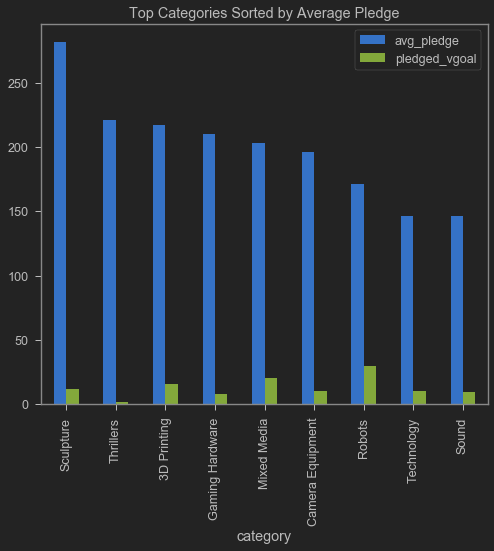

In [34]:
cat_pd = pd.pivot_table(data_sht,index='category',values=['avg_pledge','pledged_vgoal'], aggfunc=np.mean)
cat_pd.sort_values(by = 'avg_pledge', ascending=False)[1:10].plot(kind='bar').set_title("Top Categories Sorted by Average Pledge")

Text(0.5, 1.0, 'Worst Categories Sorted by Average Pledge')

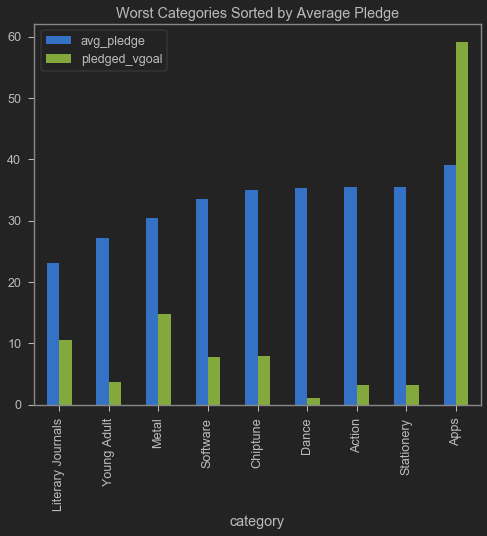

In [35]:
cat_pd.sort_values(by = 'avg_pledge', ascending=True)[1:10].plot(kind='bar').set_title("Worst Categories Sorted by Average Pledge")

We also look at average pledge numbers for the highest frequencies categories. <br> 


In [36]:
# Aggregate: Category level 
cat_valcount = pd.DataFrame(data_sht.category.value_counts())
cat_valcount.reset_index(level=0, inplace=True)
cat_valcount.columns = ['category','value_count']
avg_pledge_cat = data_sht.groupby("category").apply(lambda x: np.mean(x['amt.pledged']/x['num.backers'])).reset_index()
pledged_vgoal = data_sht.groupby('category')['pledged_vgoal'].mean().reset_index()

# merge category level aggregations 
cat_groups = pd.merge(avg_pledge_cat, pledged_vgoal.merge(cat_valcount,on='category'), on='category', how='left')
cat_groups_highval = cat_groups[cat_groups.value_count >= 40]  # isolate only highest frequency values 
len(cat_groups_highval) 
cat_groups_highval.columns = ['category','avg_pledge_backer','pledged_vgoal','value_count']

16

Text(0.5, 1.0, 'Average Pledge/Backer vs. Category  Top Freq Category')

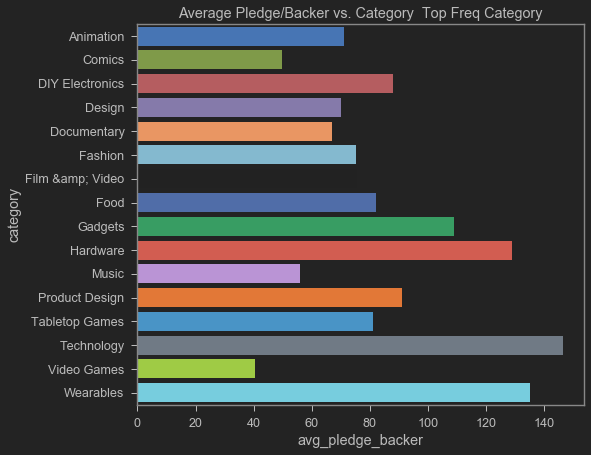

In [37]:
# plot Average pledge/backer against categories for high frequency categories
sns.barplot(x='avg_pledge_backer', y = 'category', 
            data=cat_groups_highval).set_title("Average Pledge/Backer vs. Category  Top Freq Category")

### Category Research (Data 17): 
Data17 has over 300k records and shows both a "main category" and a sub-category <br> 
We take a look at Fashion and the **sub-category counts** within it. 

num records in main category: Fashion 17938


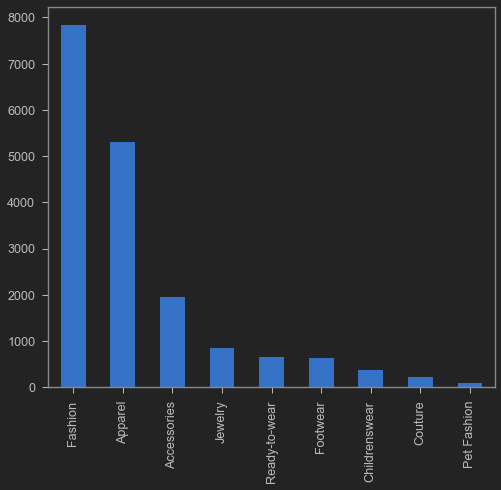

In [38]:
# create df just for fashion 
ks_fash = data17[data17.main_category=='Fashion']
ks_fash.category.value_counts().plot(kind='bar')
print("num records in main category: Fashion", len(ks_fash))

We now expand past the broader Fashion cateogry (**Orelse** categories), and run the same count per sub-category. The main addition is 'Product Design' which has nearly 17k additional records. 

## Edit Orelse category list (data17 set) 
oe_cat = ['Apparel','Accessories','Childrenswear','Couture', 'Crafts', 'Fashion', 'Jewelry',
          'Knitting','Pet Fashion', 'Product Design', 'Quilts','Ready-to-wear','Textiles', 'Weaving']
ks_oe = data17[data17.category.isin(oe_cat)]
print("Num of records in Orelse Category: ", len(ks_oe))
ks_oe.category.value_counts().plot(kind='bar')

### Launch Month Analysis 

In [65]:
# Launch month Analysis : Create Field
launch_month = data17['launched'].dt.month
data17['launch_month'] = launch_month
ks_oe = data17[data17.category.isin(oe_cat)]

outcome,0,1,success_perc
launch_month,,,
1,2028,718,0.26
2,2138,806,0.27
3,2380,980,0.29
4,2176,930,0.30
5,2259,896,0.28
6,2468,975,0.28
7,2666,995,0.27
8,2410,891,0.27
9,2371,1029,0.30


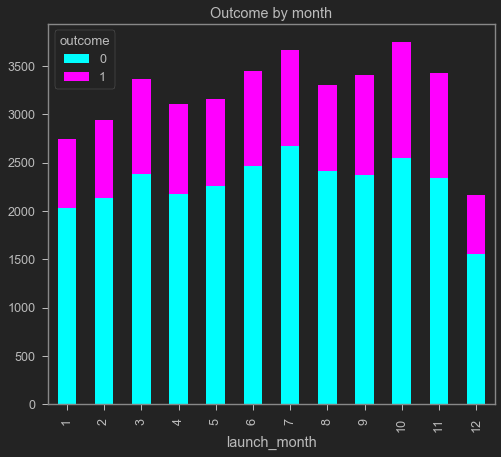

In [66]:
# check launch month for fashion categories: See Average PLedge 
launch_pivot = pd.pivot_table(ks_oe, index='launch_month',values='outcome', aggfunc=np.mean)
launch_outcome = pd.crosstab(ks_oe.launch_month, ks_oe.outcome)
launch_outcome['success_perc'] = launch_pivot.outcome
launch_outcome[launch_outcome.columns[0:2]].plot(kind='bar', 
            stacked=True, color=['cyan', 'magenta'], grid=False, title='Outcome by month')
launch_outcome   # Note  Lower outcome rates for Orelse categories

pandas.core.frame.DataFrame

Text(0.5, 1.0, 'Average Pledge/Backer by Launch Month')

,launch_month,avg_pledge
0,1,57.81
1,2,63.10
2,3,65.68
3,4,64.25
4,5,66.50
5,6,63.12
6,7,51.57
7,8,53.90
8,9,59.40
9,10,59.20


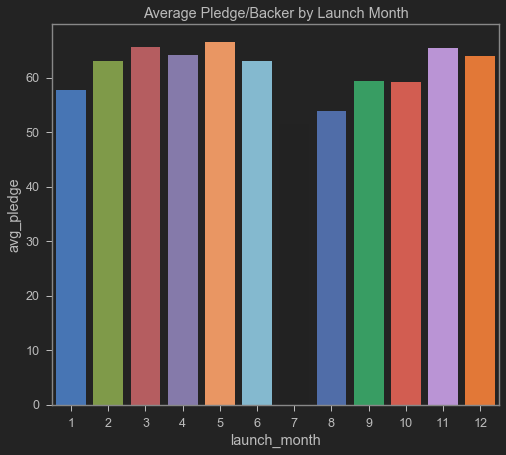

In [42]:
# launch month: see average pledge 
launch_pivot_ap = pd.pivot_table(data17, index='launch_month',values='avg_pledge', aggfunc=np.mean).reset_index()
type(launch_pivot_ap)
sns.barplot(x='launch_month', y = 'avg_pledge', 
            data=launch_pivot_ap).set_title("Average Pledge/Backer by Launch Month")
launch_pivot_ap

In terms of both success rate and average pledge, the numbers are similar by month with February-May better for the latter, and Feb-May and Nov/Dec for the average pledge. 

### Pledge Amount
The ```data_sht``` dataset (4k records) is the only one with granular pledge tier data. This data is stored as two lists: <br> 
1. Pledge Tiers
2. Number of Backers per tier. <br> 
We run ```expand_df_flatten``` to flatten ```data_sht``` adding a row for each pledge tier. then we run ```flatten_list_df``` to flatten the *Number of Backers Per Tier* field and add it to the flattened dataframe. 

In [8]:
# First flatten pledge tier then add flatted num of backers lists 
data_sht_exp = DF.expand_df_flatten(data_sht, "pledge.tier", "pledge_tier2")
data_sht_exp['num_backers'] = DF.flatten_list_df(data_sht, "num.backers.tier")
data_sht_exp.shape

(57996, 14)

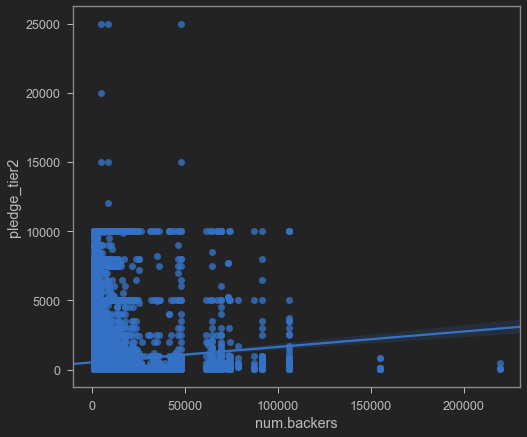

In [44]:
# Scatterplot of num_backers per pledge Tier 
data_sht_exp['pledge_tier2'] = pd.to_numeric(data_sht_exp['pledge_tier2'], errors='coerce')  # convert pledge_tiers to numbers 
sns.regplot(x=data_sht_exp['num.backers'], y=data_sht_exp['pledge_tier2'])

Observations from the scatterplot: <br> 
1. There is a small but slightly positive relationship between number of backers and the size of the pledge tier: more backers the larger the pledge tier. However, this looks to be skewed by a few projects a massive number of backers. 
2. The vast majority of pledge tiers received less than 50k backers. <br> 
We now zoom in and look at pledge tier below 5k. 

(52609, 16)

Text(0.5, 1.0, 'Pledge Tier vs. Number of Backers')

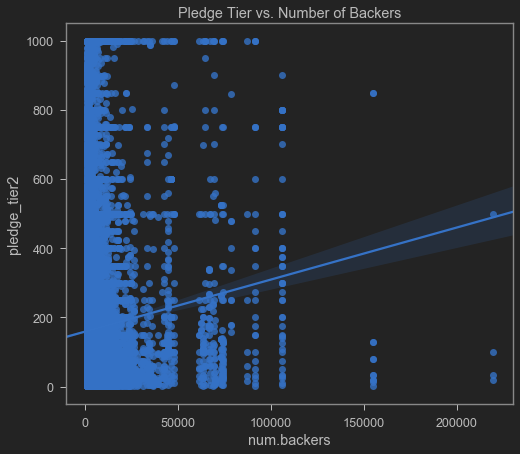

In [59]:
data_sht_exp2 = data_sht_exp[data_sht_exp['pledge_tier2'] <= 1000]
data_sht_exp2.shape
sns.regplot(x = data_sht_exp2['num.backers'], y = data_sht_exp2['pledge_tier2']).set_title('Pledge Tier vs. Number of Backers')

There is now a more pronounced positive relationship, which is likely being pulled by a full outliers with a massive number of backers. <br> 
We can zoom in further by looking at only explicitly clothing categories

### Project Experience
Compare success for project creators with more than 2 projects vs. those without less. <br> 
We create <font color=green> project threshold </font> flag which is set to 1 if a project creator has done more than the <font color=green> exp_thresh </font> number of projects 

No of projects (out of 4k) 130


Text(0.5, 1.0, 'Pledge Tier vs. Number of Backers: Apparel')

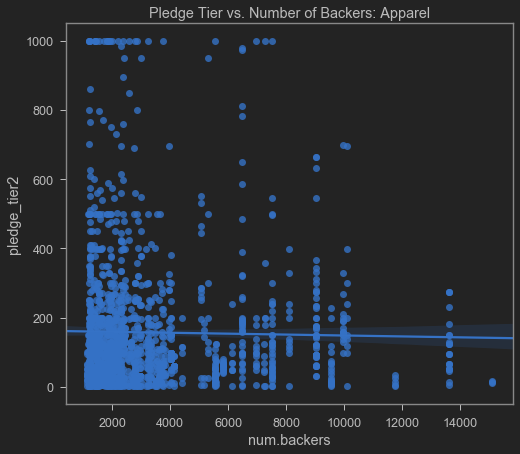

In [69]:
sht_cat = ['Fashion','Wearables','Ready-to-wear','Childrenswear']
print("No of projects (out of 4k)", len(data_sht[data_sht.category.isin(sht_cat)]))
data_sht_exp3 = data_sht_exp2[data_sht_exp2.category.isin(sht_cat)]
sns.regplot(x = data_sht_exp3['num.backers'], 
            y = data_sht_exp3['pledge_tier2']).set_title('Pledge Tier vs. Number of Backers: Apparel')

Within clothing,the outliers (in terms of backers) have been removed and slightly negative.

### Project Experience
Over 3k unique creators in ```data_sht```, but only 42 with fairly deep experience (5 or more projects). One creator had 24 projects. 

In [90]:
by_counts = pd.DataFrame(data_sht.by.value_counts()).reset_index()  
by_counts.by.describe()   # statistics on count by project creator 
by_counts.columns = ['project_creator','count']
print("No. of Creators with 5 or more projects: ", len(by_counts[by_counts['count']>=5]))

count   3137.00
mean       1.28
std        1.04
min        1.00
25%        1.00
50%        1.00
75%        1.00
max       24.00
Name: by, dtype: float64

No. of Creators with 5 or more projects:  42


**Compare success for project creators with more than 2 projects vs. those without less.** <br> 
We create **project threshold** flag which is set to 1 if a project creator has done more than the ```exp_thresh``` number of projects 

In [91]:
# Isolate IDs for high and low experience
exp_thresh = 2    # threshold for no. of projects to count as high experience
by_counts_gr2 = by_counts['project_creator'][by_counts['count']>exp_thresh]
print("Number of project creators with >", exp_thresh, 'projects: ', len(by_counts_gr2))
print("Total number of projectc reators ", len(by_counts))

Number of project creators with > 2 projects:  171
Total number of projectc reators  3137


In [92]:
# Create dummy variabel for projects above threshold 
df_by = pd.DataFrame(data_sht[['by','avg_pledge','pledged_vgoal']])
df_by['proj_thresh_fl'] = (data_sht.by.isin(by_counts_gr2)).astype(int)
df_by.proj_thresh_fl.value_counts()

0    3256
1     744
Name: proj_thresh_fl, dtype: int64

Show **average pledge** by project threshold flag. <br> 
1: Greater than experience threshold: currently set to 2 project.<br> 
0: Project Creator has only done 1 or 2 projects. <br> 
We see here those who have done **more projects** have fairly even average plegdges. However, they really shine when it comes to **performance**, measured as *pledge vs. goal*.

Average Pledge by Proj_thresh_flag


Text(0.5, 1.0, 'Experience vs. Average Pledge')

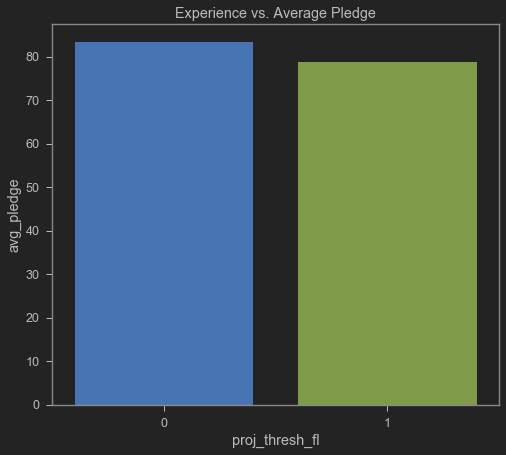

In [103]:
avg_pledge_proj_thresh = df_by.groupby('proj_thresh_fl')['avg_pledge'].mean().reset_index()
print("Average Pledge by Proj_thresh_flag")
sns.barplot(x='proj_thresh_fl', y = 'avg_pledge', data=avg_pledge_proj_thresh).set_title("Experience vs. Average Pledge")

Pledge vs. Gaol by Project Threshold Flag


Text(0.5, 1.0, 'Experience vs.Pledged/Goal')

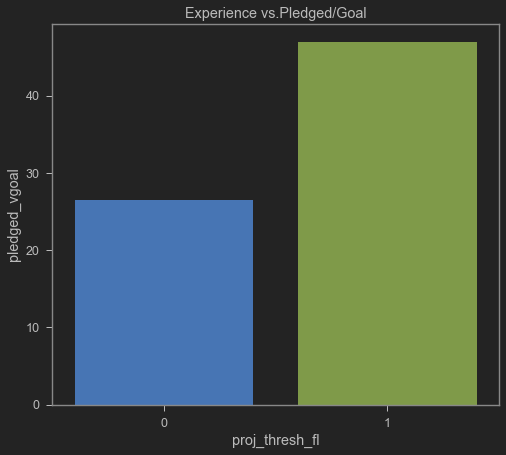

In [100]:
pledgevgoal_proj_thresh = df_by.groupby('proj_thresh_fl')['pledged_vgoal'].mean().reset_index()
print("Pledge vs. Gaol by Project Threshold Flag" )
sns.barplot(x='proj_thresh_fl', y = 'pledged_vgoal', data=pledgevgoal_proj_thresh).set_title("Experience vs.Pledged/Goal")

## Country Analysis
Both of the larger datasets:```data17``` and ```data15``` have robust country data. <br> 
We start with *average pledge* and *pledged vs. goal* for ```data17```

Text(0.5, 1.0, 'Average Pledge by Country: Full Dataset')

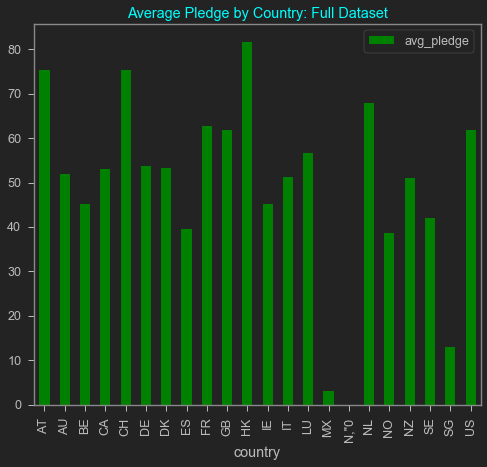

In [104]:
pd.pivot_table(data17, index='country', values='avg_pledge', 
               aggfunc=np.mean).plot(kind='bar', color='green').set_title("Average Pledge by Country: Full Dataset", color='cyan')

Text(0.5, 1.0, 'Pledged vs. Gaol: Full Dataset')

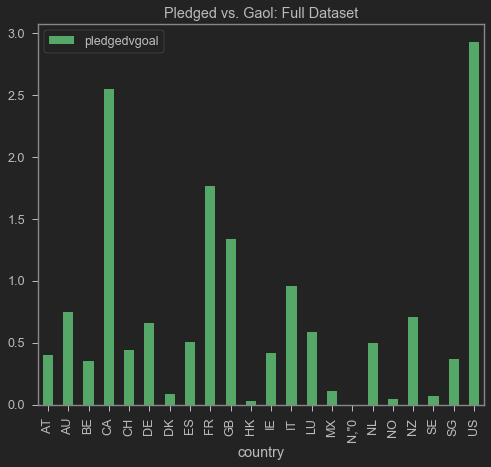

In [105]:
pd.pivot_table(data17, index='country', values='pledgedvgoal', 
               aggfunc=np.mean).plot(kind='bar',color='g').set_title("Pledged vs. Gaol: Full Dataset")

In terms of average pledge, **Hong Kong** backers spend the most on average followed by *China* and *Austria*. <br> 
In terms of performance vs. goal, **US** and **Canadian** backers blow the field away, followed by *France* and *Germany* by a much lower degree. <br> <br> 
The dataset ```data15``` **does not campaigns backed by Asia**, and uses different response variables: <br> 
1.  Success Rate 
2.  Number of Backers <br> 
Here the US outperforms on both metrics vs. other Western countries. 

Text(0.5, 1.0, 'Success Rate by Country')

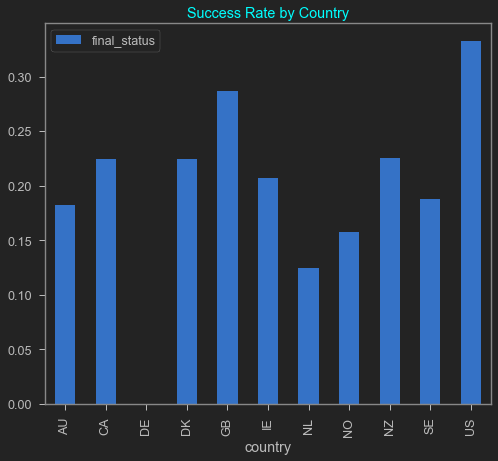

In [110]:
pd.pivot_table(data15, index = 'country', values='final_status', 
                        aggfunc=np.mean).plot(kind='bar').set_title("Success Rate by Country", color='cyan')

Text(0.5, 1.0, 'Average No. Backers by Country')

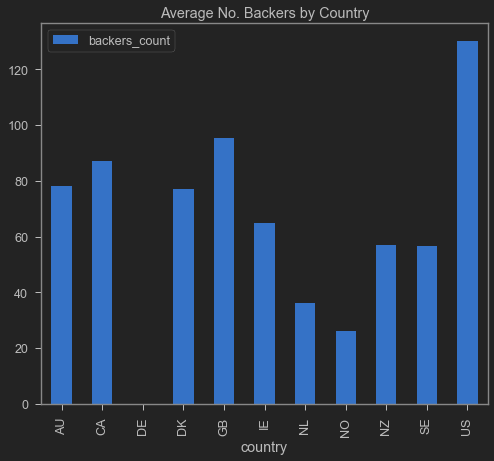

In [109]:
pd.pivot_table(data15, index='country', values='backers_count', 
               aggfunc=np.mean).plot(kind='bar').set_title("Average No. Backers by Country")

### Country Analysis: Orelse Categories
We dive a little deeper into the ```Data17``` dataset which provides category level data, where we can look into the categories related to **Orelse**. <br> 
Simialr to above, we see an even sharper outperformance targeting **Hong Kong and China**. <br> 
On a *pledged vs. goal* basis, backers in **France** pledges have far surpassed goal by over 3x. 

Text(0.5, 1.0, 'Average Pledge by Country: Fashion Categories')

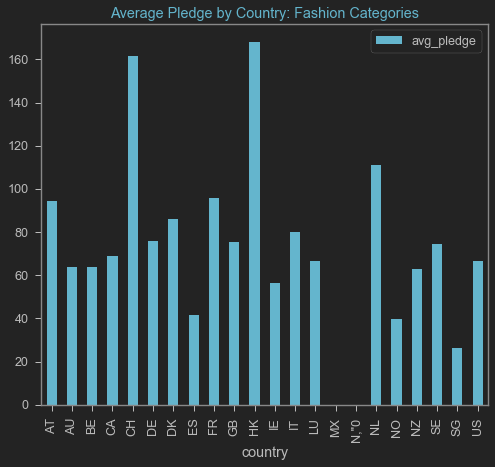

In [111]:
pd.pivot_table(ks_oe, index='country', values='avg_pledge', 
               aggfunc=np.mean).plot(kind='bar', color='c').set_title("Average Pledge by Country: Fashion Categories", color='c')

Text(0.5, 1.0, 'Pledged vs. Goal by Country: Fashion Categories')

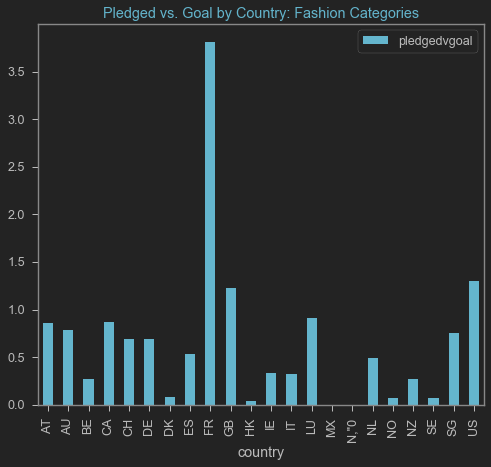

In [107]:
pd.pivot_table(ks_oe, index='country',values='pledgedvgoal', 
               aggfunc=np.mean).plot(kind='bar',color='c').set_title('Pledged vs. Goal by Country: Fashion Categories', color='c')

## Text Exploration
See if we can extract trends from the keywords in the blurbs or titles of the three files. 

We apply Worclouds to the following short (4k obs) and long (320k+ obs) datasets and features/fields. ```data15``` also has text fields in their *description* and *name*, but we will use this file later for specific keyword processing
1. ```data_sht```:  **Blurb and Title** Fields 
  - All fashion 
  - All fashion > 50th percentile in *average pledge*
  - All fashion > 50th percentile in *pledged amt / goal* 
2. ```data17```: Only **Name** field available to apply WordCloud. 
  - Orelse Categories (ks_oe dataset) 
  - Orelse Categories >50th percentile in *average pledge* 
  - Orelse Categories > 50th percentile in *pledged vs. goal* <br> <br> 
 
```Data_sht``` Dataset: 

WordCloud for Fashion Blurb: All Backers


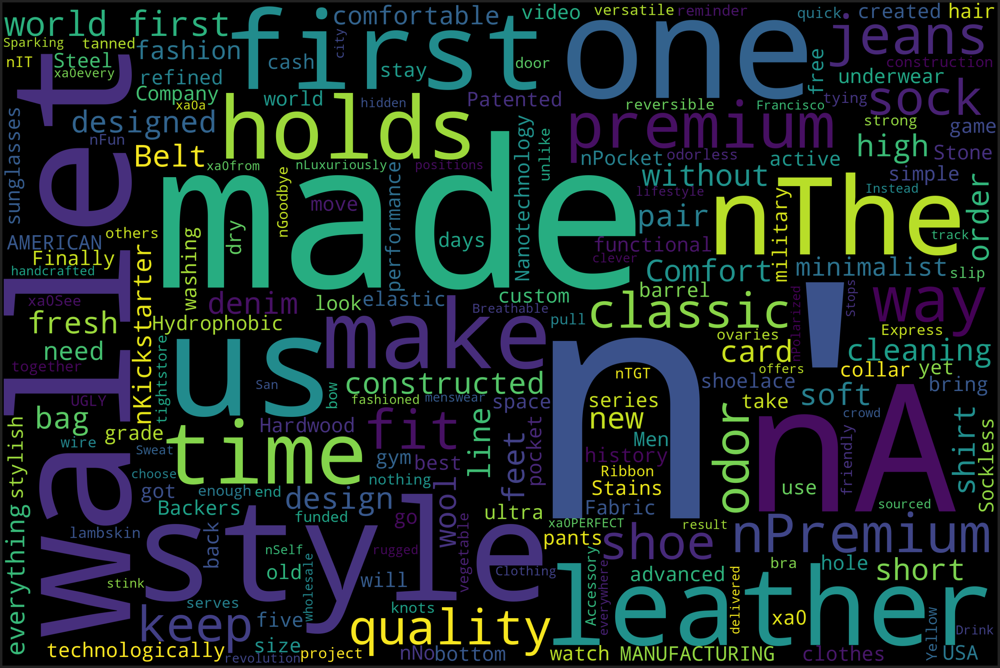

WordCloud for Fashion Title: All Backers


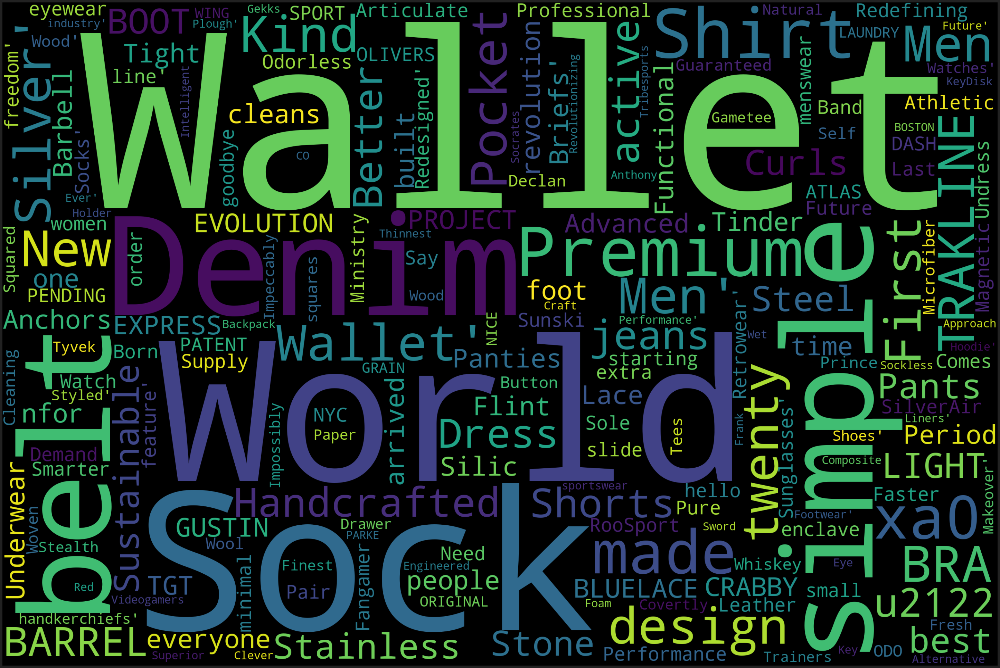

In [33]:
# WordCloud of top backers in Fashion only 
    # Blurbs for Fashion category
df_fashion = data_sht[data_sht.category=='Fashion']
text = df_fashion.blurb.values
print("WordCloud for Fashion Blurb: All Backers")
DF.wordcloud_vis(text)
    # Title for fashion category
text = df_fashion.title.values
print("WordCloud for Fashion Title: All Backers")
DF.wordcloud_vis(text) 

Socks and wallets make up most of the fashion category for ```data_sht```, with a higher prevalance of Men's products. Now we examine the wordclouds for the higher performing campaigns within Fashion based on **Blurb** and **Title**. 

Wordcloud on BLURB (High Average Backer): Number of projects 31


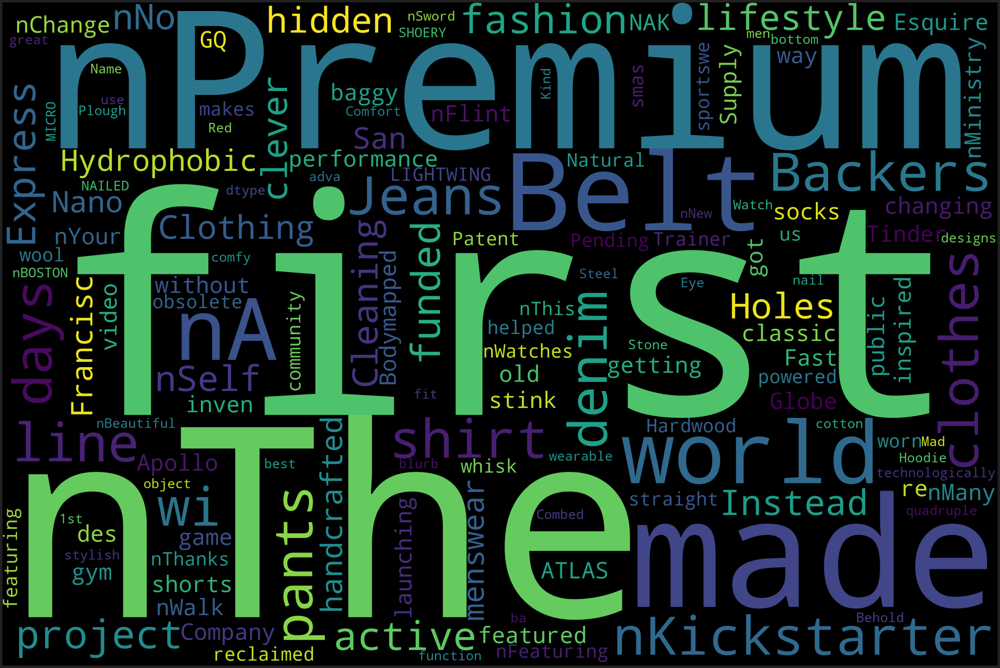

Wordcloud on TITLE (High Average Backer): Number of Projects 31


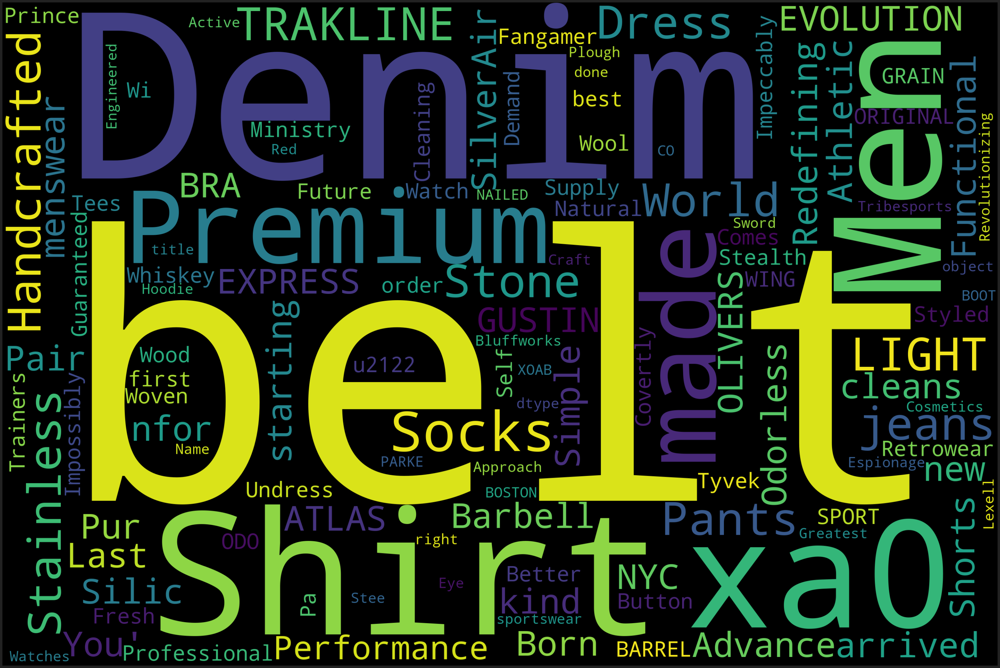

In [52]:
# WordCloud for Blurb: highest average pledge within Fashion
    # isolate top average / backer by percentile 
tgt_perc_fashion = 50
perc_avgback_fashion = np.percentile(data_sht.avg_pledge[data_sht.category=='Fashion'], tgt_perc_fashion)
text = data_sht.blurb[(data_sht.category=='Fashion') & (data_sht.avg_pledge>=perc_avgback_fashion)] 
print("Wordcloud on BLURB (High Average Backer): Number of projects", len(text) ) 
DF.wordcloud_vis(text)

# Wordcloud for titiel: highest avg pledge within Fashion 
text = data_sht.title[(data_sht.category=='Fashion') & (data_sht.avg_pledge>=perc_avgback_fashion)]
print("Wordcloud on TITLE (High Average Backer): Number of Projects", len(text))
DF.wordcloud_vis(text)

While the Wordclouds are similar, we see more 'problem' type words like "holes" or "cleaning" in the higher avg pledge blurb. The title also features "men" and "denim" more prominently. 

Wordcloud on Blurb (Highest Pledge / Goal): Number of projects 31


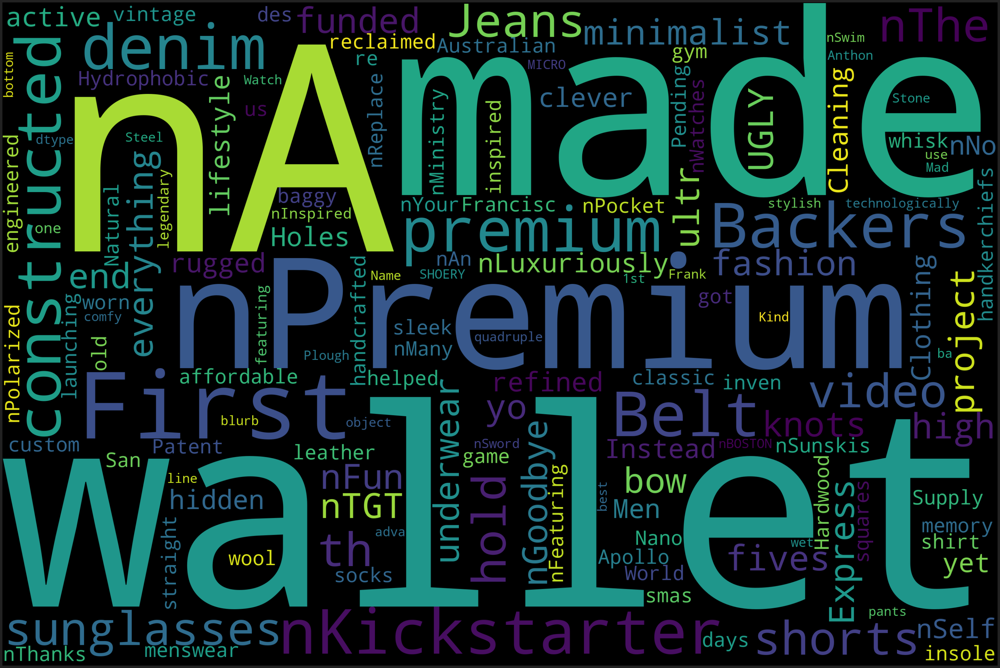

Wordcloud on Title (Highest Pledge / Goal): Number of projects 31


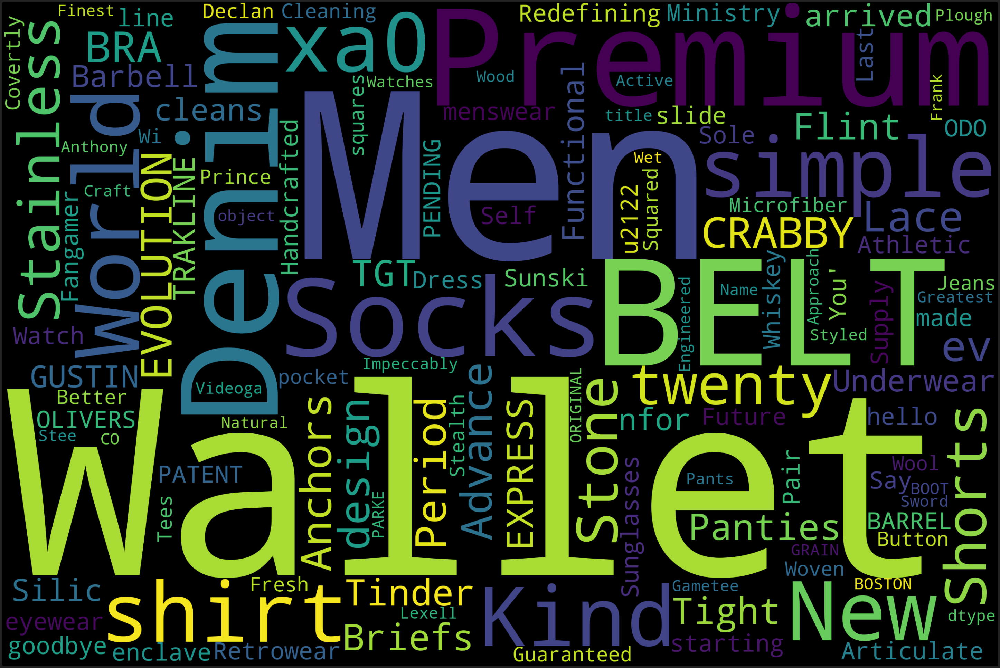

In [62]:
# WordCloud on Blurb: highest "Pledge over Goal" within Fashion
    # isolate top average / backer by percentile 
perc_pledgevgoal_fashion = np.percentile(data_sht.pledged_vgoal[data_sht.category=='Fashion'], tgt_perc_fashion)
text = data_sht.blurb[(data_sht.category=='Fashion') & (data_sht.pledged_vgoal>=perc_pledgevgoal_fashion)] 
print("Wordcloud on Blurb (Highest Pledge / Goal): Number of projects", len(text) )
DF.wordcloud_vis(text)

Wordcloud on Title (Highest Pledge / Goal): Number of projects 31


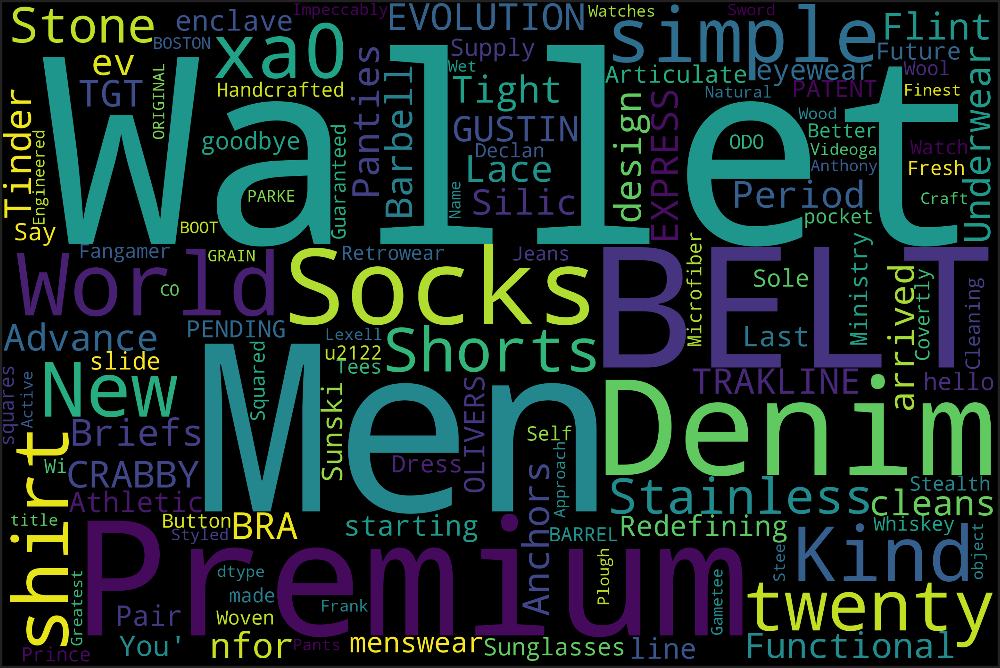

In [63]:
# WordCloud on title: highest "Pledge over Goal" within Fashion 
text = data_sht.title[(data_sht.category=='Fashion') & (data_sht.pledged_vgoal>=perc_pledgevgoal_fashion)] 
print("Wordcloud on Title (Highest Pledge / Goal): Number of projects", len(text) )
DF.wordcloud_vis(text)

Run similar wordclouds on the```data17``` Dataset except for the **Name** field. 

WordCloud for Oresle Category Names


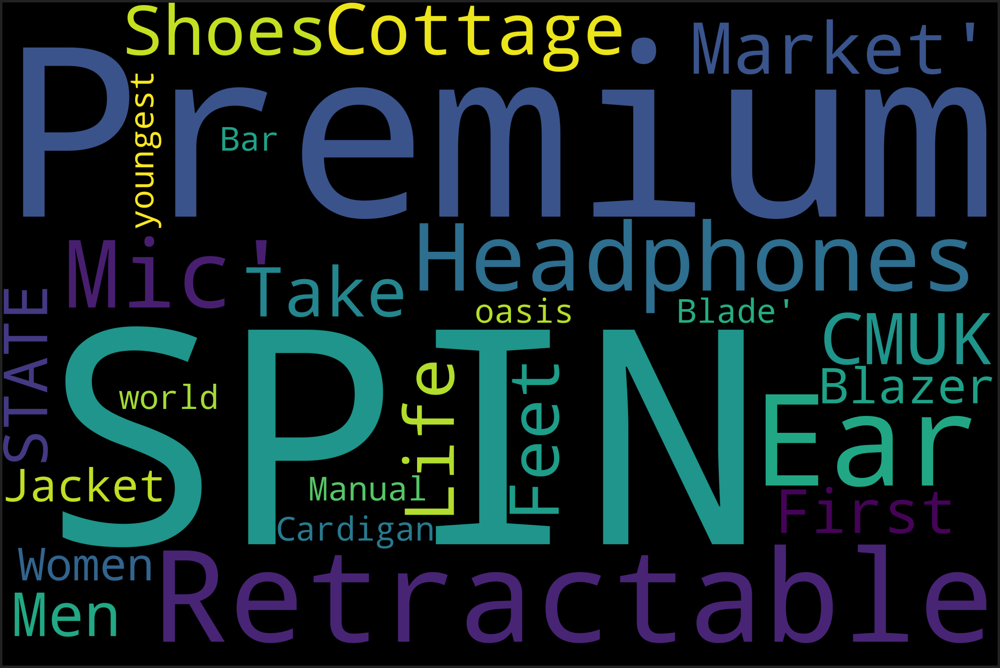

In [58]:
# Create Wordcloud for all Orelse categories
text = ks_oe.name.values
print("WordCloud for Oresle Category Names")
DF.wordcloud_vis(text)

Wordcloud (Data17) on BLURB (High Average Backer): Number of projects 19232


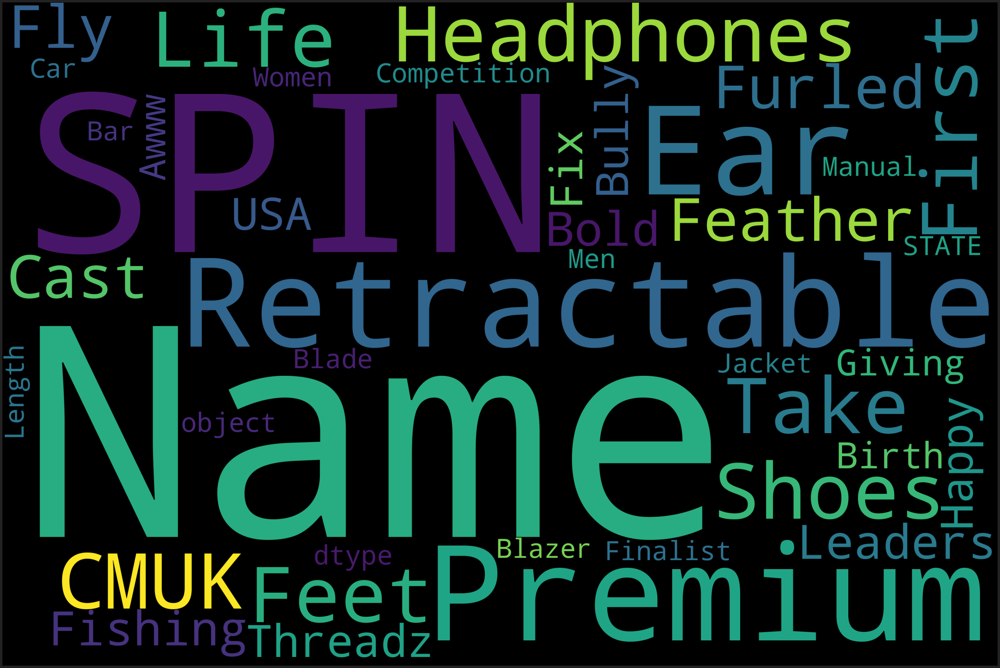

Wordcloud (Data17) on Blurb (Highest Pledge / Goal): Number of projects 19224


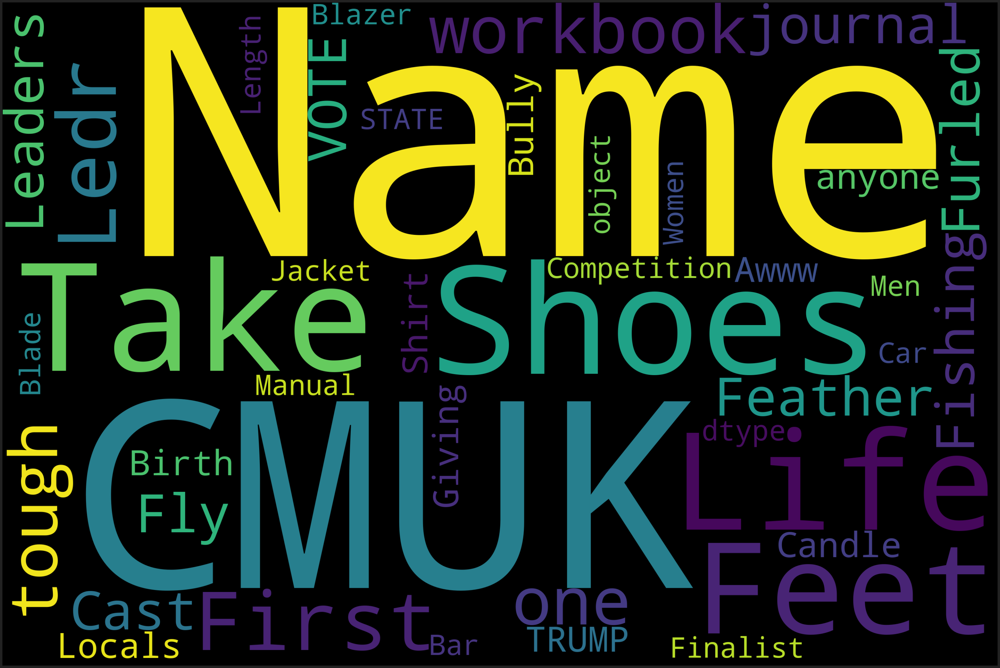

In [61]:
# tgt_perc_fashion = 50
perc_avgback_fashion = np.percentile(ks_oe.avg_pledge, tgt_perc_fashion)
text = ks_oe.name[ks_oe.avg_pledge>=perc_avgback_fashion] 
print("Wordcloud (Data17) on BLURB (High Average Backer): Number of projects", len(text) ) 
DF.wordcloud_vis(text)

perc_pledgevgoal_fashion = np.percentile(ks_oe.pledgedvgoal, tgt_perc_fashion)
text = ks_oe.name[ks_oe.pledgedvgoal>=perc_pledgevgoal_fashion] 
print("Wordcloud (Data17) on Blurb (Highest Pledge / Goal): Number of projects", len(text) )
DF.wordcloud_vis(text)

In [59]:
ks_oe.columns

Index(['ID', 'name', 'category', 'main_category', 'currency', 'deadline',
       'goal', 'launched', 'pledged', 'state', 'backers', 'country',
       'usd pledged', 'avg_pledge', 'pledgedvgoal', 'outcome', 'launch_month'],
      dtype='object')

### Specific Keyword Research on *Orelse* relevant terms. 
```Data15``` is only file with specific columns for *keywords*. <br> 
Create individual fields based on presence of key words <br> <br> 
We will *create columns* with 0 or 1 values based on presence of keyword. 
1. Easily distinguishable: These are words that we can simply test for presence of in a string, since they are not likely to be part of other words. 
2. Difficult to distinguish words: typicall smalelr words like 'men' which can be part of larger words like 'acumen.' We tokenize these words <br> 

We start with the first category: 
1. Create dictionary for field and words to search for. 
2. Create new field in ```data15``` based on presence of values in dictionary 

In [19]:
kw_field = ['eco_fl','sust_fl','zero_waste_fl','men_fl','unisex_fl', 'vegan_fl',
           'travel_fl','functional_fl', 'versatile_fl','modern_fl']

In [20]:
# --- Test: Create dictinaries with field names 
kw_dict = {'sust_fl': ['sustainable','sustainability'], 
           'zero_waste_fl':['zero-waste','zero waste','no waste','no-waste'],
           'unisex_fl':['unisex'],
           'vegan_fl':['vegan','plant-based','plant based'],
           'functional_fl':['functional'],
           'versatile_fl':['versatil'],
           'modern_fl':['modern'],
           'travel_fl':['travel'],
           'fash_fl':['fashion']
          }

In [41]:
# Create new columns based on presence of keywords in dictionary 
for key in kw_dict.keys():
    data15[key] = data15.keywords.str.contains('|'.join(kw_dict.get(key)))*1
    # data[key] = str_presence_full(data.keywords, kw_dict.get(key))
print("number of records with search word")
for key in kw_dict.keys():
    print(key)
    np.sum(data15[key])

number of records with search word
sust_fl


107

zero_waste_fl


2

unisex_fl


4

vegan_fl


95

functional_fl


34

versatile_fl


29

modern_fl


306

travel_fl


455

fash_fl


321

Process second type (smaller words) by calling tokenizing function (see **preproc** section). 

In [10]:
# data['sust_fl'] = str_presence_full(data.keywords, ['sustainable','sustainability'])
data15['eco_fl'] = DF.str_presence_full(data15.keywords, ['eco'])
data15['men_fl'] = DF.str_presence_full(data15.keywords, ['men','male'])
print("Number of records with search word" )
np.sum(data15['eco_fl'])
np.sum(data15['men_fl'])

Number of records with search word


108

177

**Store performance metrics for each keyword in table** 

In [44]:
success_score = [] 
avg_num_backers = [] 
for fld in kw_field:
    success_score.append(np.mean(data15.final_status[data15[fld]==1]))
    avg_num_backers.append(np.mean(data15.backers_count[data15[fld]==1]))
    
sum_text_table = pd.DataFrame({'keyword':kw_field})
sum_text_table['success_score'] = success_score
sum_text_table['avg_num_backers'] = avg_num_backers


Text(0.5, 1.0, 'Success Rate by Keyword')

Text(0.5, 0, 'Success Score')

Text(0, 0.5, 'Keyword')

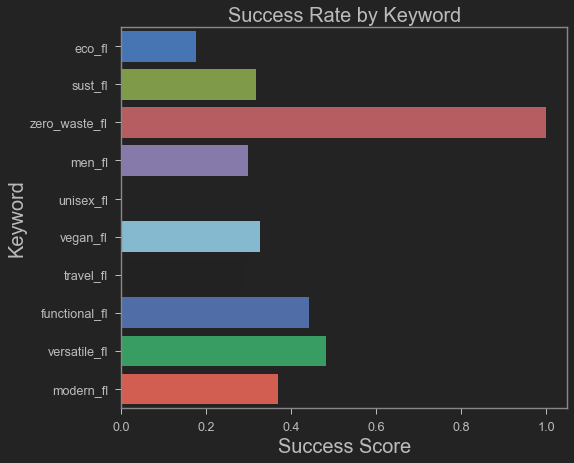

In [45]:
# Success Score barchart per word
key_bar = sns.barplot(x = 'success_score', y='keyword', data=sum_text_table)
key_bar.axes.set_title("Success Rate by Keyword", fontsize=20)
key_bar.set_xlabel('Success Score', fontsize=20)
key_bar.set_ylabel('Keyword', fontsize=20)

Highest *success rate* came from the presence of "zero-waste" as a keyword with nearly 100% success. <br>
Now we look at *number of backers* for each keyword 

Text(0.5, 1.0, 'Average No. of Backers by Keyword')

Text(0.5, 0, 'Average Number of Backers')

Text(0, 0.5, 'keyword')

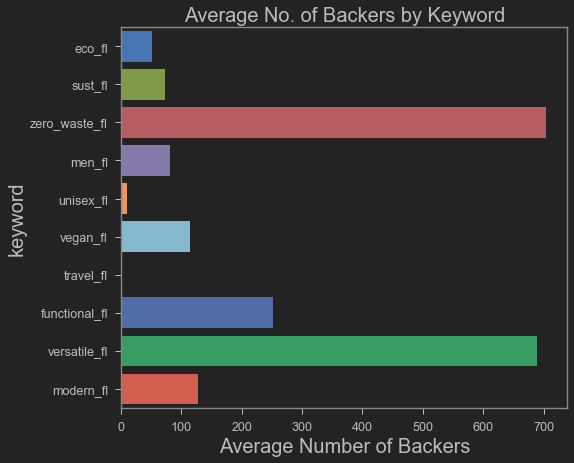

In [46]:
#Avg backers per keyword: barchart 
key_numback_bar = sns.barplot(x ='avg_num_backers', y='keyword', data=sum_text_table)
key_numback_bar.set_title("Average No. of Backers by Keyword", fontsize=20)
key_numback_bar.set_xlabel("Average Number of Backers", fontsize=20)
key_numback_bar.set_ylabel("keyword", fontsize=20)

We again see the presence of "zero-waste" outperforming other keywords in terms of the average number of backers. "Versatility" had nearly the same number of backers, but a far lower success rate than "zero-waste." 

## Adjacent Category Research
Look at successful projects with mid-tier organic raising: <br> 
1. Goal being USD $10K-80k 
2. NOT in clothing or NOT in fashion or NOT in tech or NOT in food  but in other consumer product goods (lifestyle goods, books, media, equipment) <br> <br> 
Look for similar characteristics/audience as Or/else <br> <br> 
We first isolate the dataset based on the two conditions above. 

In [67]:
# Create DF: Remove Food, Technology, and Food, and only keep projects with $10-80k goals 
rm_cat = ['Technology','Food','Fashion']
min_goal = 10000
max_goal = 80000
data_sm = data17[~data17.main_category.isin(rm_cat)]
data_sm = data_sm[(data_sm.goal>=min_goal) & (data_sm.goal<=max_goal)]

Compare number of records and response btn: 
1. Original dataset: full ```data17``` 
2. Adjacent Fashion Category subset
3. Orelse categories

For *Orelse* categories, we also shrink the dataset within the goal range

In [71]:
ks_oe_sm = ks_oe[(ks_oe.goal>=min_goal) & (ks_oe.goal<=max_goal)]

In [72]:
print("original no. of records", len(data17)) 
print("smaller: no. of records", len(data_sm))
print("Orelse Categories", len(ks_oe))
print("Average Pledge: Original", np.mean(data17.goal))
print("Average Pledge: Smaller", np.mean(data_sm.goal))
print("Average Pledge: Orelse Categories", np.mean(ks_oe_sm.goal))

original no. of records 313656
smaller: no. of records 76004
Orelse Categories 38448
Average Pledge: Original 46594.445574036494
Average Pledge: Smaller 24265.906168096415
Average Pledge: Orelse Categories 25327.451059510902


In [73]:
print("success rate by category and launch month")
pd.pivot_table(data_sm, index='launch_month', columns='main_category', values='outcome', aggfunc=np.mean)
print("success rate for Orelse Categories by launch month")
pd.pivot_table(ks_oe_sm, index='launch_month', values='outcome', aggfunc=np.mean)

success rate by category and launch month


main_category,Art,Comics,Crafts,Dance,Design,Film & Video,Games,Journalism,Music,Photography,Publishing,Theater
launch_month,,,,,,,,,,,,
1,0.16,0.37,0.05,0.45,0.24,0.24,0.29,0.13,0.34,0.14,0.14,0.37
2,0.22,0.54,0.13,0.42,0.30,0.31,0.28,0.16,0.37,0.28,0.18,0.37
3,0.25,0.36,0.13,0.49,0.30,0.30,0.28,0.18,0.38,0.23,0.20,0.40
4,0.30,0.39,0.14,0.40,0.30,0.33,0.27,0.18,0.34,0.31,0.20,0.39
5,0.25,0.35,0.11,0.42,0.27,0.30,0.27,0.20,0.39,0.31,0.22,0.39
6,0.30,0.41,0.14,0.43,0.31,0.31,0.28,0.20,0.42,0.27,0.18,0.44
7,0.21,0.36,0.09,0.35,0.29,0.28,0.23,0.13,0.36,0.18,0.18,0.35
8,0.21,0.38,0.09,0.32,0.28,0.27,0.28,0.13,0.33,0.24,0.19,0.31
9,0.26,0.36,0.15,0.37,0.31,0.30,0.28,0.11,0.37,0.28,0.25,0.37


success rate for Orelse Categories by launch month


,outcome
launch_month,
1,0.21
2,0.26
3,0.26
4,0.28
5,0.25
6,0.27
7,0.26
8,0.25
9,0.28


*Orelse* categories have typically done well Feb-May and Sep-Nov. While isn't a lot of overlap in seasonality across categories, a quick look at the other categories shows similar seasonality in Art, Film&Video, Music, and Photography. <br>
we also compare average pledge and pleged vs. gol by categories and compare to *Orelse*'s categories. 

In [74]:
pivot1 = pd.pivot_table(data_sm, index='main_category', values=['avg_pledge','pledgedvgoal'], aggfunc=np.mean) 
# Add row for Oresle category on bottom.  
pivot1.loc['Orelse_Cat'] = [np.mean(ks_oe_sm.avg_pledge)] + [np.mean(ks_oe_sm.pledgedvgoal)]
pivot1

,avg_pledge,pledgedvgoal
main_category,,
Art,76.27,0.37
Comics,51.52,0.84
Crafts,47.97,0.18
Dance,85.71,0.48
Design,99.00,1.05
Film & Video,92.69,0.40
Games,57.42,1.07
Journalism,46.23,0.23
Music,74.35,0.48


Despite *Orelse's* category having a lower success rate than the average 36%, it has among the highest average pledges and pledge outperformance. The category with probably the most similar avg pledge and pledge outperformance combo is *Design*. 

In [10]:
data15.head()

,project_id,name,desc,goal,keywords,disable_communication,country,currency,deadline,state_changed_at,created_at,launched_at,backers_count,final_status
0,kkst1451568084,drawing for dollars,I like drawing pictures. and then i color them...,20.0,drawing-for-dollars,False,US,USD,1241333999,1241334017,1240600507,1240602723,3,1
1,kkst1474482071,Sponsor Dereck Blackburn (Lostwars) Artist in ...,"I, Dereck Blackburn will be taking upon an inc...",300.0,sponsor-dereck-blackburn-lostwars-artist-in-re...,False,US,USD,1242429000,1242432018,1240960224,1240975592,2,0
2,kkst183622197,Mr. Squiggles,So I saw darkpony's successfully funded drawin...,30.0,mr-squiggles,False,US,USD,1243027560,1243027818,1242163613,1242164398,0,0
3,kkst597742710,Help me write my second novel.,Do your part to help out starving artists and ...,500.0,help-me-write-my-second-novel,False,US,USD,1243555740,1243556121,1240963795,1240966730,18,1
4,kkst1913131122,Support casting my sculpture in bronze,"I'm nearing completion on a sculpture, current...",2000.0,support-casting-my-sculpture-in-bronze,False,US,USD,1243769880,1243770317,1241177914,1241180541,1,0
